# Basic Setup

In [338]:
pip install -q bentoml

Note: you may need to restart the kernel to use updated packages.


In [274]:
pip install -q sqids

Note: you may need to restart the kernel to use updated packages.


In [337]:
!pip install -q Pillow

In [1]:
import bentoml
import json
import os
import requests
import shutil
import random
import math

from dotenv import load_dotenv
from jinja2 import Template
from litellm import completion
from pydantic import BaseModel
from pydantic.json import pydantic_encoder
from typing import List
from IPython import display
from pathlib import Path
from uuid import uuid4
from sqids import Sqids
from PIL import Image, ImageDraw, ImageFont
import textwrap
import os
from tqdm.notebook import tqdm

In [2]:
load_dotenv()

True

In [4]:
sqids = Sqids()

In [8]:
sqids.encode([1, 0, 2, 3, 7])

'ySrE3uj1Jv'

# Download the document

In [30]:
# Download the raw text and strip out all the gutenberg start stuff
doc_response = requests.get(
    "https://www.gutenberg.org/cache/epub/23962/pg23962.txt",
)
doc = doc_response.text
strip_index = doc.find("第一回")
doc = doc[strip_index:].strip()
doc[:100]

'第一回     靈根育孕源流出\u3000心性修持大道生\r\n\r\n\r\n\u3000\u3000詩曰：\r\n\u3000\u3000\u3000\u3000混沌未分天地亂，茫茫渺渺無人見。\r\n\u3000\u3000\u3000\u3000自從盤古破鴻濛，開闢從茲清濁辨。\r\n\u3000\u3000\u3000\u3000覆載群生仰至仁，發明萬物皆成善。'

In [32]:
# Split everything into paragraphs and remove the added
# superfluous newlines
raw_paragraphs = doc.split("\r\n\r\n")
paragraphs = [p.replace("\r\n","") for p in raw_paragraphs]
paragraphs[:5]

['第一回     靈根育孕源流出\u3000心性修持大道生',
 '\u3000\u3000詩曰：\u3000\u3000\u3000\u3000混沌未分天地亂，茫茫渺渺無人見。\u3000\u3000\u3000\u3000自從盤古破鴻濛，開闢從茲清濁辨。\u3000\u3000\u3000\u3000覆載群生仰至仁，發明萬物皆成善。\u3000\u3000\u3000\u3000欲知造化會元功，須看西遊釋厄傳。',
 '蓋聞天地之數，有十二萬九千六百歲為一元。將一元分為十二會，乃子、丑、寅、卯、辰、巳、午、未、申、酉、戌、亥之十二支也。每會該一萬八百歲。且就一日而論：子時得陽氣，而丑則雞鳴﹔寅不通光，而卯則日出﹔辰時食後，而巳則挨排﹔日午天中，而未則西蹉﹔申時晡，而日落酉，戌黃昏，而人定亥。譬於大數，若到戌會之終，則天地昏曚而萬物否矣。再去五千四百歲，交亥會之初，則當黑暗，而兩間人物俱無矣，故曰混沌。又五千四百歲，亥會將終，貞下起元，近子之會，而復逐漸開明。邵康節曰：：「冬至子之半，天心無改移。一陽初動處，萬物未生時。」到此，天始有根。再五千四百歲，正當子會，輕清上騰，有日，有月，有星，有辰。日、月、星、辰，謂之四象。故曰，天開於子。又經五千四百歲，子會將終，近丑之會，而逐漸堅實。《易》曰：「大哉乾元！至哉坤元！萬物資生，乃順承天。」至此，地始凝結。再五千四百歲，正當丑會，重濁下凝，有水，有火，有山，有石，有土。水、火、山、石、土，謂之五形。故曰，地闢於丑。又經五千四百歲，丑會終而寅會之初，發生萬物。曆曰：「天氣下降，地氣上升﹔天地交合，群物皆生。」至此，天清地爽，陰陽交合。再五千四百歲，子會將終，近丑之會，而逐漸堅實。《易》曰：「大哉乾元！至哉坤元！萬物資生，乃順承天。」至此，地始凝結。再五千四百歲，正當丑會，重濁下凝，有水，有火，有山，有石，有土。水、火、山、石、土，謂之五形。故曰，地闢於丑。又經五千四百歲，丑會終而寅會之初，發生萬物。曆曰：「天氣下降，地氣上升﹔天地交合，群物皆生。」至此，天清地爽，陰陽交合。再五千四百歲，正當寅會，生人，生獸，生禽，正謂天地人，三才定位。故曰，人生於寅。',
 '感盤古開闢，三皇治世，五帝定倫，世界之間，遂分為四大部洲：曰東勝神洲，曰西牛賀洲，曰南贍部洲，曰北俱蘆洲。這部書單表東勝神洲。海外有一國土，名曰傲來國。國近大海

In [117]:
with open('data/journey_to_the_west_text.json', 'w') as f:
    f.write(json.dumps(paragraphs, indent=4))

# Setup our datatypes

In [8]:
class StoryScene(BaseModel):
    """A brief description of a scene in a story."""

    description: str = ""
    """A two or three line description of a scene in a story."""

    characters: List[str] = []
    """The names of characters in the scene, if any."""

class StorySceneDetailed(StoryScene):
    id: int
    start_index: int
    end_index: int
    story: str
    
class StoryScenes(BaseModel):
    """A series of story scenes."""

    scenes: List[StoryScene]
    """One or more extracted story scenes."""

class ScenePrompt(BaseModel):
    """An image prompt for a story scene."""

    prompt: str
    """A prompt to an image generation model for a story scene."""

    theme: str
    """A description of the selected theme for the prompt."""

class ScenePromptDetailed(ScenePrompt):
    id: int
    scene_id: int
    
class ScenePrompts(BaseModel):
    """A list of Scene Prompts."""

    prompts: List[ScenePrompt]
    """One or more Scene Prompts."""

# Extract some scenes from the first few paragraphs

In [74]:
schema = StoryScenes.model_json_schema()
tools = [
    {
        "type": "function",
        "function": {
            "name": StoryScenes.__name__,
            "description": schema["description"],
            "parameters": schema,
        },
    }
]

In [75]:
prompt_template = Template("""
Extract the major scenes from this series of paragraphs from a story:

<paragraphs>
{% for p in paragraphs %}
{{ p }}
{% endfor %}
</paragraphs>
"""
)

In [54]:
messages = [
    {
        "role": "user", 
        "content": prompt_template.render(
            paragraphs=paragraphs[:5],
        ),
    }
]
response = completion(
    model="anthropic/claude-3-5-sonnet-20240620",
    messages=messages,
    tools=tools,
    tool_choice=StoryScenes.__name__,
)

In [63]:
scenes = []
for tool_call in response.choices[0].message.tool_calls:
    f = tool_call.function
    arguments = f.arguments
    extracted_scenes = StoryScenes(**json.loads(arguments))
    scenes.extend(extracted_scenes.scenes)
print(scenes)

[StoryScene(description='The creation of the universe and the concept of time cycles', characters=['盤古 (Pangu)']), StoryScene(description='The formation of the world through different time periods (子, 丑, 寅, etc.)', characters=[]), StoryScene(description='The division of the world into four great continents', characters=['三皇 (Three Sovereigns)', '五帝 (Five Emperors)']), StoryScene(description='Introduction of the Aolai country and the Flower Fruit Mountain', characters=[]), StoryScene(description='Detailed description of the Flower Fruit Mountain and its magical features', characters=[]), StoryScene(description='The peculiar stone atop the Flower Fruit Mountain', characters=[])]


# Extract Image Prompts for the first scene

In [65]:
scene_prompt_schema = ScenePrompts.model_json_schema()
scene_prompt_tools = [
    {
        "type": "function",
        "function": {
            "name": ScenePrompts.__name__,
            "description": scene_prompt_schema["description"],
            "parameters": scene_prompt_schema,
        },
    }
]

In [67]:
scene_prompt_template = Template("""
Given the specified scene related to the paragraphs below, extract multiple prompts to an image generation model.  
For each prompt, pick a creative artistic theme to follow.

<scene>
{{ scene }}
</scene>

<paragraphs>
{% for p in paragraphs %}
{{ p }}
{% endfor %}
</paragraphs>
"""
)

In [72]:
response = completion(
    model="anthropic/claude-3-5-sonnet-20240620",
    messages=[
        {
            "role": "user", 
            "content": scene_prompt_template.render(
                paragraphs=paragraphs[:5],
                scene=scenes[0],
            ),
        }
    ],
    tools=scene_prompt_tools,
    tool_choice=ScenePrompts.__name__,
)

In [80]:
extracted_prompts = []
for tool_call in response.choices[0].message.tool_calls:
    f = tool_call.function
    arguments = f.arguments
    ep = ScenePrompts(**json.loads(arguments))
    extracted_prompts.extend(ep.prompts)
extracted_prompts[0]

ScenePrompt(prompt='Pangu, a primordial giant, emerging from a cosmic egg, splitting the chaotic darkness into sky and earth, with swirling energies of yin and yang surrounding him', theme='Ancient Chinese mythology meets abstract expressionism')

In [7]:
extracted_prompts[2].prompt

NameError: name 'extracted_prompts' is not defined

# Generate the Labels

In [339]:
# First read in the prompts
extracted_prompts = []
sqids = Sqids()
with open('data/extracted_prompts_detailed_0.json') as f:
    json_data = json.load(f)
    for d in json_data: 
        extracted_prompts.append(ScenePromptDetailed(**d))

In [340]:
# Setup some data classes we'll re-use
class SoapBatch(BaseModel):
    batch_id: int
    recipe_id: int
    name: str
    base_oils: List[str]
    essential_oils: List[str]
    count: int

class LabelStyle(BaseModel):
    name: str
    id: int
    text: str

class LabelContentText(BaseModel):
    prompt_text: str
    label_text: str
    magic_code: str

In [441]:
# Setup the image styles
base_styles = [
    ("by-makoto-shinkai", "by Makoto Shinkai"),
    ("claymation", "in  Clay Animation style"),
    ("diorama", "in diorama style"),
    ("gemmacorrell", "in Gemma Correll Style"),
    ("hasuikawase", "in Hasui Kawase Style"),
    ("kaynielsen", "in Kay Nielsen Style"),
    ("kirigami", "In Japanese Kirigami Style"),
    ("picture-story-book", "in Picture-Story Book Style"),
    ("pixel-art-xl", "in Pixel Art Style"),
    ("tangbohu-style", "in classical Chinese Tang Bo Hu Style"),
    ("MidCenturyComic", "in Mid-century Comic Style"),
    ("PapierMache", "in Papier Mache Style"),
    ("VintageMarker", "in Vintage Marker Style"),
    ("BricksStyle", "in Red Bricks Style"), 
    ("centurybotanical", "in Century Botanical Illustration style"),
    ("ghibli", "in Studio Ghibli Style"),
    ("guofeng-chinese-style", "in Guo Feng Chinese Style"),
    ("jessiewillcox", "in Jessie Willcox Style"),
    ("johnberkey", "in John Berkeley Style"),
    ("yanzhi-paper-quilling", "In Yanzhi paper quilling style"),
]
styles = [
    LabelStyle(name=name, id=idx, text=text)
    for idx, (name, text) in enumerate(base_styles)
]
with open('data/label_styles.json', 'w') as f:
    f.write(json.dumps(styles, default=pydantic_encoder, indent=4))

In [342]:
# Create the soap batches
soap_batches = [
    SoapBatch(
        batch_id=1,
        recipe_id=1,
        name="Old Faithful",
        base_oils=["Coconut Oil", "Olive Oil", "Palm Oil", "Castor Oil"],
        essential_oils=["Jasmine EO", "Douglas Fir EO"],
        count=6,
    ),
    SoapBatch(
        batch_id=2,
        recipe_id=1,
        name="Old Faithful",
        base_oils=["Coconut Oil", "Olive Oil", "Palm Oil", "Castor Oil"],
        essential_oils=["Pine Needles EO", "Neroli EO"],
        count=6,
    ),
    SoapBatch(
        batch_id=3,
        recipe_id=1,
        name="Old Faithful",
        base_oils=["Coconut Oil", "Olive Oil", "Palm Oil", "Castor Oil"],
        essential_oils=["Geranium EO"],
        count=6,
    ),
    SoapBatch(
        batch_id=4,
        recipe_id=2,
        name="Old Faithful",
        base_oils=["Coconut Oil", "Olive Oil", "Palm Oil", "Castor Oil", "Avocado Oil"],
        essential_oils=["Hinoki EO", "Rose EO"],
        count=6,
    ),
    SoapBatch(
        batch_id=5,
        recipe_id=2,
        name="Old Faithful",
        base_oils=["Coconut Oil", "Olive Oil", "Palm Oil", "Castor Oil", "Avocado Oil"],
        essential_oils=["Clary Sage EO" "Myrrh EO"],
        count=6,
    ),
]

In [423]:
# Create the raw label template
label_text_template = Template("""Ingredients:
{{ base_oils }}, Water, Lye, {{ essential_oils }}

Magic Code: {{ magic_code }}

Story:
{{story_text}}""")

label_size_px = cm_to_pixels(5)
sheet_width = cm_to_pixels(21)
sheet_height = cm_to_pixels(29.7)
padding_pixels = 20
font_size = 24
font = ImageFont.truetype("NotoSansSC-Regular.ttf", font_size)

In [389]:
def create_batch_prompts(soap_batch):
    # First, sample an extracted prompt
    extracted_prompt = random.sample(extracted_prompts, 1)[0]
    # Next, sample a style for each soap in the batch
    batch_styles = random.sample(styles, soap_batch.count)

    # Now create the prompt
    prompts = []
    for soap_id, style in enumerate(batch_styles):
        story_text = extracted_prompt.prompt
        prompt_text = extracted_prompt.prompt + " " + style.text
        magic_code = sqids.encode([
            soap_batch.batch_id,
            extracted_prompts[2].scene_id,
            extracted_prompts[2].id,
            style.id,
            soap_id,
        ])
        label_text = label_text_template.render(
            base_oils=", ".join(soap_batch.base_oils),
            essential_oils=", ".join(soap_batch.essential_oils),
            magic_code=magic_code,
            story_text=story_text,
        )
        prompts.append(LabelContentText(
            prompt_text=prompt_text,
            label_text=label_text,
            magic_code=magic_code,
        ))
    return prompts
    
def create_prompts(soap_batches):
    prompts = []
    for soap_batch in soap_batches:
        prompts.extend(create_batch_prompts(soap_batch))
    return prompts

def create_labels(soap_batches, steps=20):
    """Creates a soap image and ingredient label"""
    # First, create all the label content
    label_contents = create_prompts(soap_batches)

    # Now do the slow thing of creating each image for each label content.
    soap_images = []
    ingredient_images = []
    with bentoml.SyncHTTPClient(os.getenv("FLUX_SERVER_URL")) as client:
        for label_content in tqdm(label_contents):
            # Make the image.
            result = client.txt2img(
                prompt=label_content.prompt_text,
                num_inference_steps=steps,
            )
            # Move it somewhere safe.
            image_path = Path(f"data/result-{label_content.magic_code}.png")
            shutil.move(result, image_path)
            soap_images.append(Image.open(image_path))
    
            # Make the ingredient image
            ingredient_images.append(create_label(
                label_content.label_text,
                label_size_px,
                font, 
                font_size,
                'lightblue',
            ))
    return soap_images, ingredient_images, label_contents

In [390]:
soap_labels, ingredient_labels, label_contents = create_labels(soap_batches, steps=10)

  0%|          | 0/30 [00:00<?, ?it/s]

In [444]:
with open('data/label_contents.json', 'w') as f:
    f.write(json.dumps(label_contents, default=pydantic_encoder, indent=4))

# make a sticker sheet

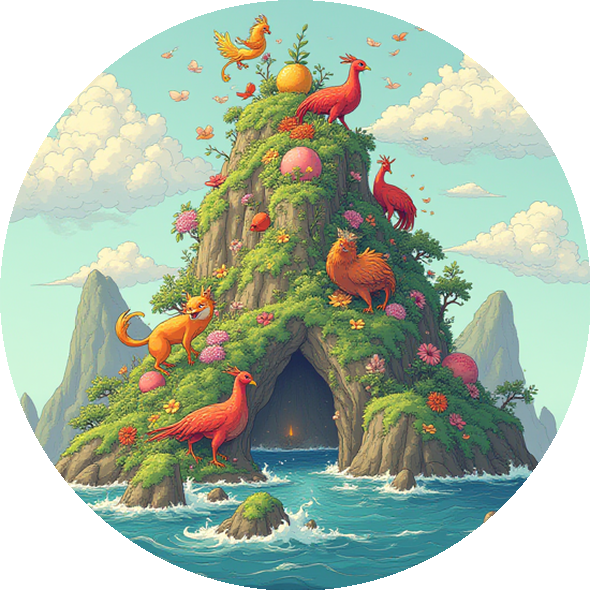

In [439]:
def create_padded_sticker(
    sticker,
    sticker_size_px,
    padding_px,
) -> Image:
    """Returns a padded version of `sticker` that fits within `sticker_size_px`"""
    inner_size_px = sticker_size_px - (padding_px * 2)
    sticker.thumbnail((inner_size_px, inner_size_px))
    sticker_bg = Image.new(
        'RGBA',
        (sticker_size_px, sticker_size_px),
        color=(0,0,0,0),
    )
    sticker_bg.paste(sticker, (padding_px, padding_px))
    return sticker_bg

def create_circular_image(
    image: Image.Image,
    output_size: int,
    background_color: str = 'white'
) -> Image.Image:
    """
    Convert a rectangular image into a circular one.
    
    Args:
        image: Source PIL Image
        output_size: Desired size (diameter) of the output circular image
        background_color: Color to use for the background
        
    Returns:
        PIL Image with the source image cropped into a circle
    """
    # Resize image to be square with the desired output size
    # Calculate the resize ratio to maintain aspect ratio
    ratio = output_size / min(image.size)
    new_size = tuple(math.ceil(dim * ratio) for dim in image.size)
    resized_image = image.resize(new_size, Image.Resampling.LANCZOS)
    
    # Create a square crop from the center of the resized image
    left = (resized_image.width - output_size) // 2
    top = (resized_image.height - output_size) // 2
    right = left + output_size
    bottom = top + output_size
    squared_image = resized_image.crop((left, top, right, bottom))
    
    # Create a new image with an alpha channel for transparency
    output_image = Image.new('RGBA', (output_size, output_size), (0, 0, 0, 0))
    
    # Create a circular mask
    mask = Image.new('L', (output_size, output_size), 0)
    draw = ImageDraw.Draw(mask)
    draw.ellipse((0, 0, output_size, output_size), fill=255)
    
    # Create the background circle
    background = Image.new('RGBA', (output_size, output_size), (0, 0, 0, 0))
    bg_draw = ImageDraw.Draw(background)
    bg_draw.ellipse((0, 0, output_size, output_size), fill=background_color)
    
    # Composite the images together
    output_image = Image.composite(squared_image, background, mask)
    
    return output_image

create_circular_image(
    soap_labels[0],
    label_size_px,
)

In [422]:
def create_details_label(
    label_text: str, 
    size_px: int, 
    font: ImageFont, 
    font_size: int,
    background_color: str,
    wrap_factor = 1.5,
) -> Image:
    label = Image.new(
        'RGB',
        (size_px, size_px),
        color=background_color,
    )
    label_draw = ImageDraw.Draw(label)
    lines = label_text.split('\n')
    y_text = 20
    for line in lines:
        wrapped_line = textwrap.fill(
            line, 
            width=size_px // (font_size // wrap_factor),
        )
        for wrap in wrapped_line.split('\n'):
            label_draw.text(
                (20, y_text), 
                wrap, 
                font=font, 
                fill='black',
            )
            left, top, right, bottom = font.getbbox(wrap)
            y_text += (bottom - top)

        left, top, right, bottom= font.getbbox(wrap)
        y_text += bottom - top
    return label
    
def cm_to_pixels(cm: int, dpi=300) -> int:
    inches = cm / 2.54
    return int(inches * dpi)

def get_text_dimensions(text: str, font: ImageFont) -> tuple:
    """Get the width and height of a text string with given font."""
    bbox = font.getbbox(text)
    return bbox[2] - bbox[0], bbox[3] - bbox[1]

def is_point_in_circle(x: int, y: int, center_x: int, center_y: int, radius: int) -> bool:
    """Check if a point (x,y) lies within a circle."""
    return math.sqrt((x - center_x) ** 2 + (y - center_y) ** 2) <= radius

def create_details_label_circle(
    label_text: str, 
    size_px: int, 
    font: ImageFont, 
    font_size: int,
    background_color: str,
    wrap_factor = 1.5,
) -> Image:
    """Create a circular label with centered text that fits within the circle."""
    # Create new image with alpha channel for circle masking
    label = Image.new('RGBA', (size_px, size_px), (0, 0, 0, 0))
    label_draw = ImageDraw.Draw(label)

    # Calculate circle parameters
    center = size_px // 2
    radius = (size_px // 2) - 10  # Leaving 10px margin

    # Draw circle
    circle_bbox = [(center - radius, center - radius),
                  (center + radius, center + radius)]
    label_draw.ellipse(circle_bbox, fill=background_color)

    # Calculate maximum width for text (using Pythagorean theorem)
    max_text_width = int(math.sqrt(2) * radius)  # This ensures text fits in circle

    # Split and wrap text
    lines = label_text.split('\n')
    wrapped_lines = []
    for line in lines:
        # Adjust wrap width based on circle constraints
        wrap_width = int(max_text_width // (font_size // wrap_factor))
        wrapped = textwrap.fill(line, width=wrap_width)
        wrapped_lines.extend(wrapped.split('\n'))

    # Calculate total text height
    total_height = 0
    _, line_height = get_text_dimensions(wrapped_lines[0], font)
    total_height = line_height * len(wrapped_lines)

    # Calculate starting y position to center text vertically
    y_text = center - (total_height // 2)

    # Draw each line
    for i, line in enumerate(wrapped_lines):
        # Get line dimensions
        width, _ = get_text_dimensions(line, font)

        # Calculate x position to center text horizontally
        x_text = center - (width // 2)

        # Draw text
        label_draw.text(
            (x_text, y_text),
            line,
            font=font,
            fill='black',
        )

        y_text += line_height
    return label

In [334]:
def create_tiled_sticker_sheet(
    sheet_width_px,
    sheet_height_px,
    image_size_px,
    images,
    dpi=300):
    # Calculate how many stickers can fit in each row and column
    stickers_per_row = sheet_width // image_size_px
    stickers_per_column = sheet_height // image_size_px
    stickers_per_sheet = stickers_per_row * stickers_per_column
    
    sheets = []
    sheet = Image.new(
        'RGBA', 
        (sheet_width_px, sheet_height_px), 
        color=(0,0,0,0),
    )
    for idx, sticker in enumerate(images):
        if idx > 0 and idx % stickers_per_sheet == 0:
            sheets.append(sheet)
            sheet = Image.new(
                'RGBA', 
                (sheet_width_px, sheet_height_px), 
                color=(0,0,0,0),
            )
        sticker.thumbnail((image_size_px, image_size_px))
        row = (idx % stickers_per_sheet) // stickers_per_row
        col = (idx % stickers_per_sheet) % stickers_per_row
        x = col * sticker_width
        y = row * sticker_height
        sheet.paste(sticker, (x, y))
    if len(images) % stickers_per_sheet != 0:
        sheets.append(sheet)
    return sheets

In [436]:
def create_avery_22807_label(
    images,
    dpi=300):
    sheet_width_px = cm_to_pixels(21.59)
    sheet_height_px = cm_to_pixels(27.94)
    image_size_px = cm_to_pixels(5.08)
    stickers_per_row = 3
    stickers_per_sheet = 12
    col_pos = [
        cm_to_pixels(1.58),
        cm_to_pixels(8.25),
        cm_to_pixels(14.92),
    ]
    row_pos = [
        cm_to_pixels(1.59),
        cm_to_pixels(8.15),
        cm_to_pixels(14.71),
        cm_to_pixels(21),
    ]
    sheets = []
    sheet = Image.new(
        'RGBA', 
        (sheet_width_px, sheet_height_px), 
        color=(0,0,0,0),
    )
    for idx, sticker in enumerate(images):
        if idx > 0 and idx % stickers_per_sheet == 0:
            sheets.append(sheet)
            sheet = Image.new(
                'RGBA', 
                (sheet_width_px, sheet_height_px), 
                color=(0,0,0,0),
            )
        sticker.thumbnail((image_size_px, image_size_px))
        row = (idx % stickers_per_sheet) // stickers_per_row
        col = (idx % stickers_per_sheet) % stickers_per_row
        x = col_pos[col]
        y = row_pos[row]
        sheet.paste(sticker, (x, y))
    if len(images) % stickers_per_sheet != 0:
        sheets.append(sheet)
    return sheets

In [445]:
graphics_sheets = create_avery_22807_label(
    [create_circular_image(
        soap_image,
        label_size_px,
    ) for soap_image in soap_labels]
)

details_sheets = create_avery_22807_label(
    [create_details_label_circle(
        label_content.label_text,
        label_size_px,
        font,
        font_size,
        'lightblue',
        wrap_factor=2.5,
    ) for label_content in label_contents]
)

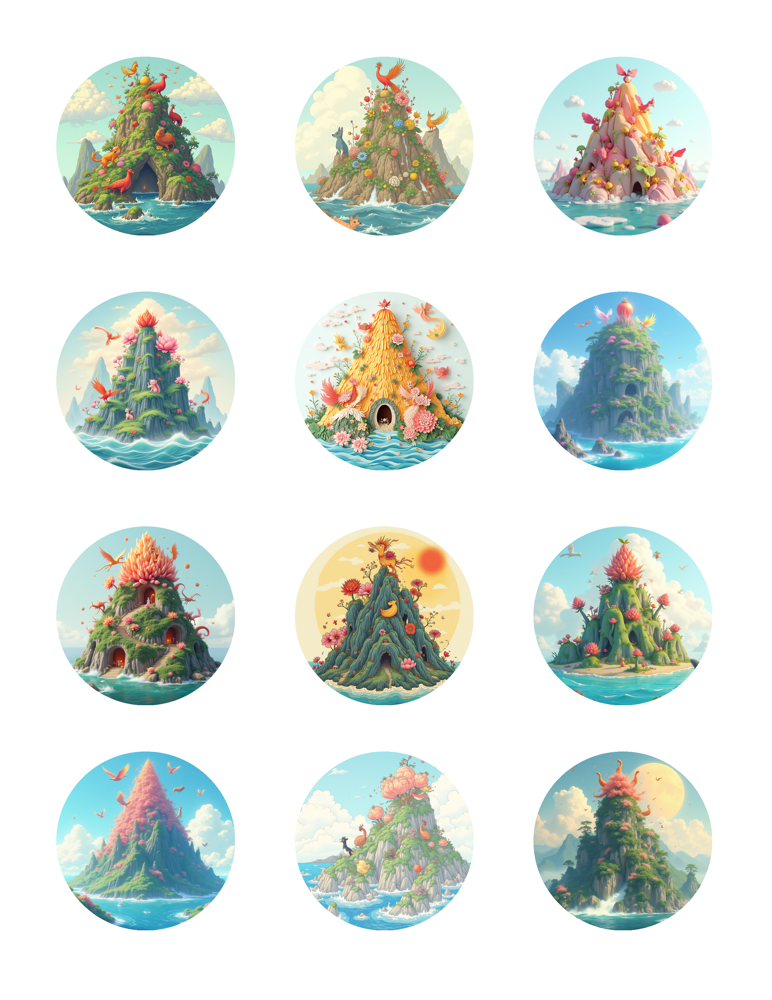

In [446]:
graphics_sheets[0]

In [433]:
for idx, (image_sheet, ingredient_sheet) in enumerate(zip(image_sheets, ingredient_sheets)):
    image_sheet.save(f"data/image_sheet_241022_{idx}.png", dpi=(300, 300))
    ingredient_sheet.save(f"data/ingredient_sheet_241022_{idx}.png", dpi=(300, 300))

# Backup all the extracted objects

In [112]:
with open('data/extracted_scenes.json', 'w') as f:
    f.write(json.dumps(scenes, default=pydantic_encoder, indent=4))
with open('data/extracted_prompts.json', 'w') as f:
    f.write(json.dumps(extracted_prompts, default=pydantic_encoder, indent=4))

In [128]:
with open('data/extracted_scenes.json') as f:
    raw_data = json.load(f)
    story_scenes_detailed = [
        StorySceneDetailed(
            id=0,
            story="journey_to_the_west",
            start_index=0,
            end_index=5,
            **e,
        )
        for e in raw_data
    ]
with open('data/extracted_scenes_detailed.json', 'w') as f:
    f.write(json.dumps(story_scenes_detailed, default=pydantic_encoder, indent=4))

In [134]:
with open('data/extracted_prompts.json') as f:
    raw_data = json.load(f)
    scene_prompts_detailed = [
        ScenePromptDetailed(
            id=idx,
            scene_id=story_scenes_detailed[0].id,
            **e,
        )
        for idx, e in enumerate(raw_data)
    ]
    print(story_scenes_detailed[0])
    print(scene_prompts_detailed)
with open(f'data/extracted_prompts_detailed_{story_scenes_detailed[0].id}.json', 'w') as f:
    f.write(json.dumps(scene_prompts_detailed, default=pydantic_encoder, indent=4))

description='The creation of the universe and the concept of time cycles' characters=['盤古 (Pangu)'] id=0 start_index=0 end_index=5 story='journey_to_the_west'
[ScenePromptDetailed(prompt='Pangu, a primordial giant, emerging from a cosmic egg, splitting the chaotic darkness into sky and earth, with swirling energies of yin and yang surrounding him', theme='Ancient Chinese mythology meets abstract expressionism', id=0, scene_id=0), ScenePromptDetailed(prompt='A circular calendar depicting the twelve earthly branches (子丑寅卯辰巳午未申酉戌亥) as cosmic cycles, with each segment showing the progression from chaos to order', theme='Surrealist clockwork', id=1, scene_id=0), ScenePromptDetailed(prompt='The formation of the universe: sun, moon, stars, and constellations emerging from primordial mist, with faint outlines of mountains, water, and land below', theme='Ethereal watercolor', id=2, scene_id=0), ScenePromptDetailed(prompt="A cosmic tree with roots in the dark chaos of 'wu' and branches reaching 